In [1]:
import os
import numpy as np
import cv2
from skimage import color
from matplotlib import pyplot as plt
from tqdm import tqdm
import random
from sklearn.cluster import KMeans
import matplotlib.gridspec as gridspec

# Colorizing the images


Viewing sample images from all folders in Training:


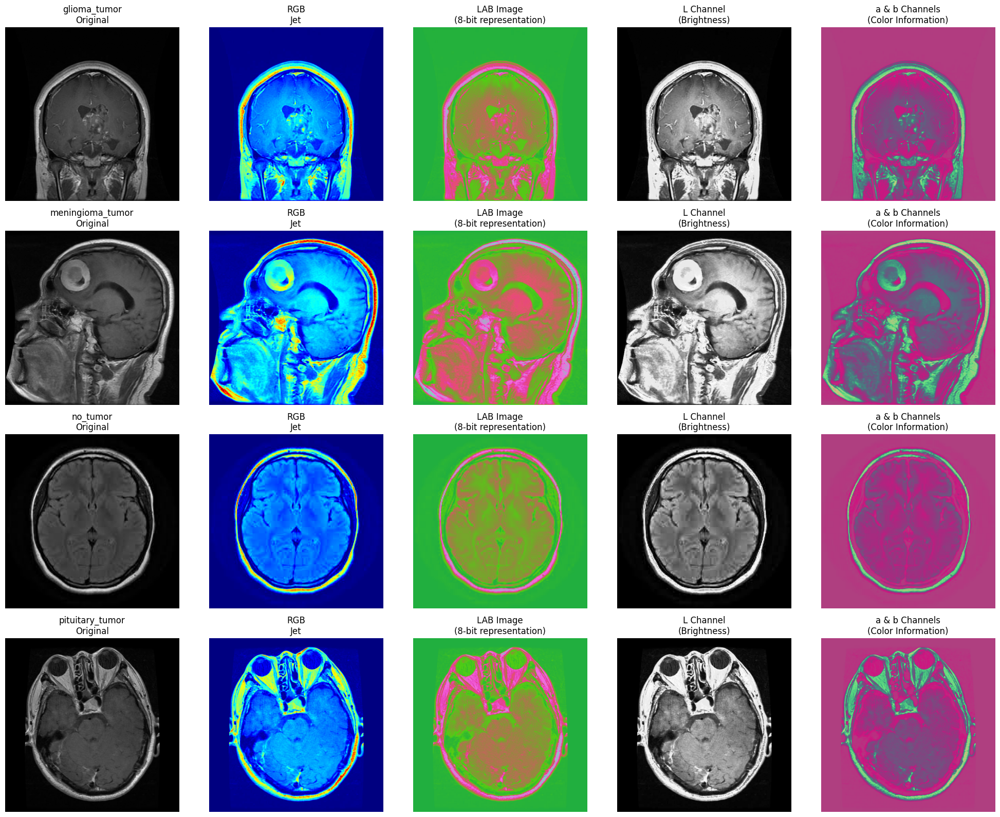


Viewing sample images from all folders in Testing:


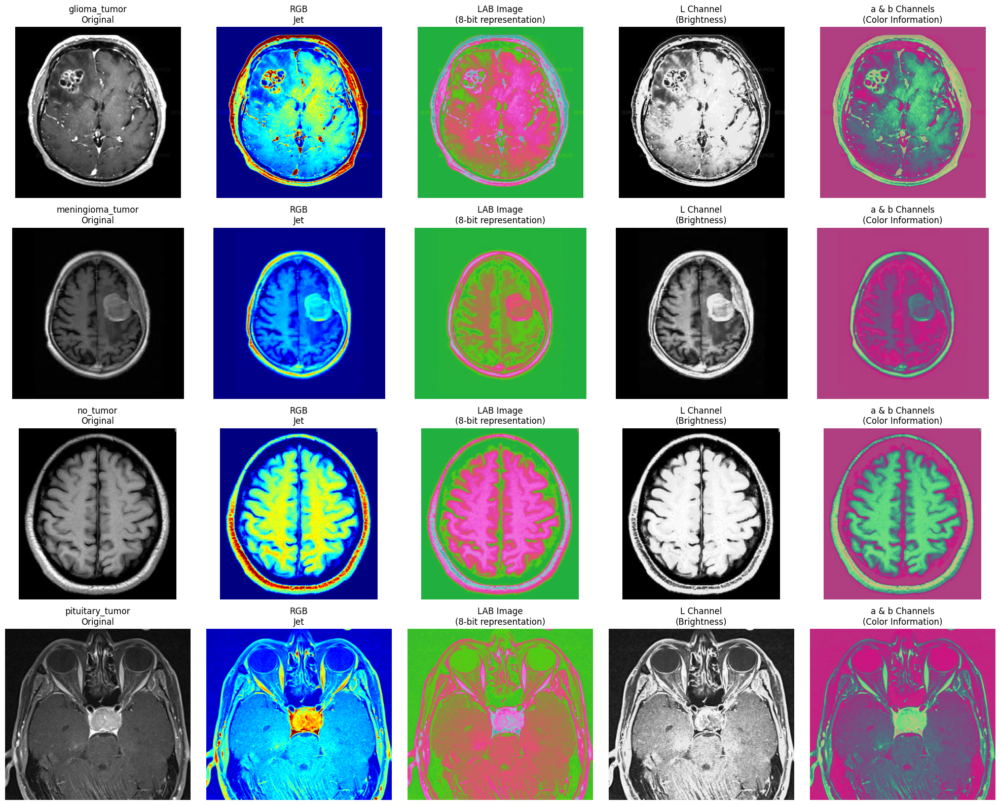


Colorizing training data...
Found images in 4 folders
Processing folder: glioma_tumor (826 images)


Colorizing images in glioma_tumor: 100%|██████████| 826/826 [02:53<00:00,  4.76it/s]


Processing folder: meningioma_tumor (822 images)


Colorizing images in meningioma_tumor: 100%|██████████| 822/822 [03:14<00:00,  4.22it/s]


Processing folder: no_tumor (395 images)


Colorizing images in no_tumor: 100%|██████████| 395/395 [00:57<00:00,  6.88it/s]


Processing folder: pituitary_tumor (827 images)


Colorizing images in pituitary_tumor: 100%|██████████| 827/827 [02:44<00:00,  5.03it/s]


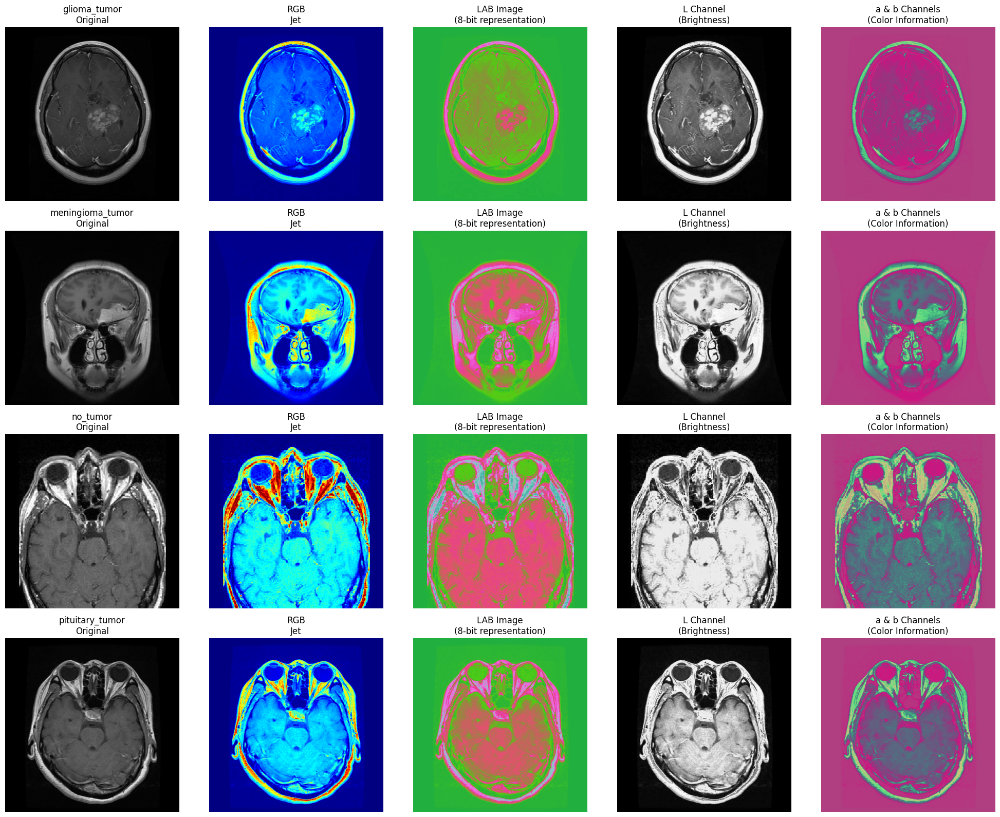


Colorizing testing data...
Found images in 4 folders
Processing folder: glioma_tumor (100 images)


Colorizing images in glioma_tumor: 100%|██████████| 100/100 [00:15<00:00,  6.56it/s]


Processing folder: meningioma_tumor (115 images)


Colorizing images in meningioma_tumor: 100%|██████████| 115/115 [00:12<00:00,  9.21it/s]


Processing folder: no_tumor (105 images)


Colorizing images in no_tumor: 100%|██████████| 105/105 [00:06<00:00, 16.35it/s]


Processing folder: pituitary_tumor (74 images)


Colorizing images in pituitary_tumor: 100%|██████████| 74/74 [00:23<00:00,  3.20it/s]


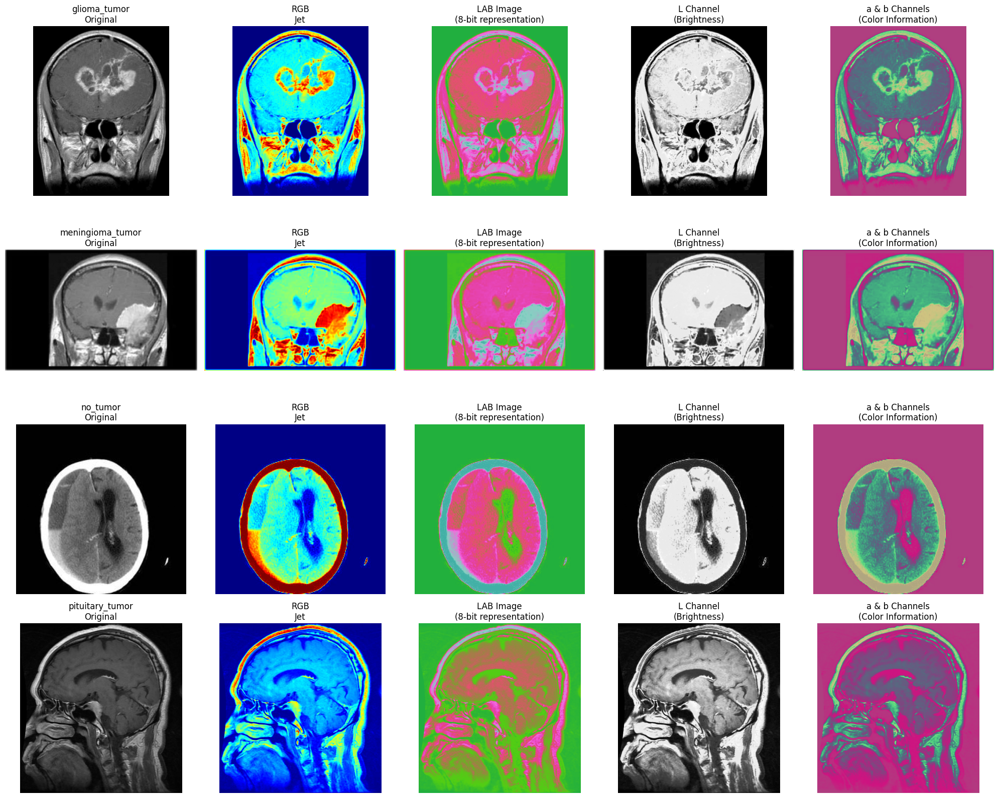

Colorization complete!

Comparing different colorization methods:


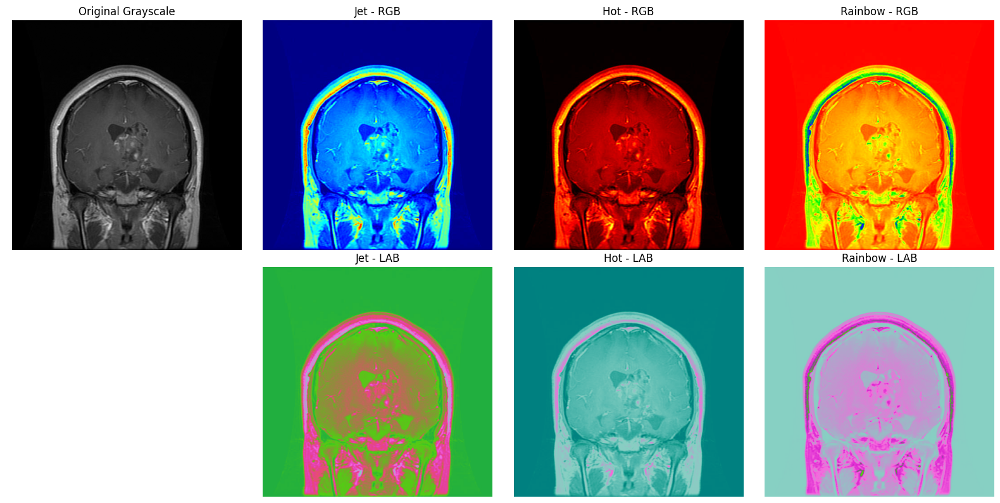

In [2]:

def colorize_mri_images(input_dir, output_dir, method='pseudocolor', visualize=False):
    """
    Colorize grayscale MRI images and convert to CIELAB color space
    
    Parameters:
    -----------
    input_dir : str
        Directory containing the grayscale MRI images
    output_dir : str
        Directory to save the colorized images
    method : str
        Method to use for colorization ('pseudocolor', 'jet', 'hot', 'rainbow')
    visualize : bool
        Whether to visualize sample images from each folder
    """
    
    # Create output directory if it doesn't exist
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
        
    # Get all image files and organize by subdirectory
    image_files_by_folder = {}
    for root, _, files in os.walk(input_dir):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg', '.tif', '.tiff')):
                rel_dir = os.path.relpath(root, input_dir)
                if rel_dir not in image_files_by_folder:
                    image_files_by_folder[rel_dir] = []
                image_files_by_folder[rel_dir].append(os.path.join(root, file))
    
    print(f"Found images in {len(image_files_by_folder)} folders")
    
    # For visualization
    sample_images = {}
    
    # Process each folder
    for folder, image_files in image_files_by_folder.items():
        print(f"Processing folder: {folder} ({len(image_files)} images)")
        
        # Process each image
        for img_path in tqdm(image_files, desc=f"Colorizing images in {folder}"):
            # Read grayscale image
            gray_img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
            
            if gray_img is None:
                print(f"Warning: Could not read {img_path}")
                continue
                
            # Create RGB image based on the selected method
            if method == 'pseudocolor':
                # Apply pseudocolor (COLORMAP_JET is commonly used for medical imaging)
                rgb_img = cv2.applyColorMap(gray_img, cv2.COLORMAP_JET)
            elif method == 'jet':
                rgb_img = cv2.applyColorMap(gray_img, cv2.COLORMAP_JET)
            elif method == 'hot':
                rgb_img = cv2.applyColorMap(gray_img, cv2.COLORMAP_HOT)
            elif method == 'rainbow':
                rgb_img = cv2.applyColorMap(gray_img, cv2.COLORMAP_RAINBOW)
            else:
                raise ValueError(f"Unknown colorization method: {method}")
            
            # Convert RGB to BGR (OpenCV format)
            rgb_img = cv2.cvtColor(rgb_img, cv2.COLOR_BGR2RGB)
            
            # Convert RGB to CIELAB
            lab_img = color.rgb2lab(rgb_img)
            
            # Create output directory structure that matches input
            rel_path = os.path.relpath(img_path, input_dir)
            output_path = os.path.join(output_dir, rel_path)
            os.makedirs(os.path.dirname(output_path), exist_ok=True)
            
            # Save RGB image
            rgb_output_path = output_path.rsplit('.', 1)[0] + '_rgb.' + output_path.rsplit('.', 1)[1]
            cv2.imwrite(rgb_output_path, cv2.cvtColor(rgb_img, cv2.COLOR_RGB2BGR))
            
            # Save LAB components separately
            base_path = output_path.rsplit('.', 1)[0]
            ext = output_path.rsplit('.', 1)[1]
            
            # Save full LAB image (converted to 8-bit for visualization)
            lab_8bit = np.zeros_like(rgb_img)
            lab_8bit[:,:,0] = np.uint8(lab_img[:,:,0] * 255 / 100)  # L component
            lab_8bit[:,:,1] = np.uint8((lab_img[:,:,1] + 128))      # a component
            lab_8bit[:,:,2] = np.uint8((lab_img[:,:,2] + 128))      # b component
            cv2.imwrite(f"{base_path}_lab.{ext}", lab_8bit)
            
            # Optionally save L, a, b channels separately
            #cv2.imwrite(f"{base_path}_l.{ext}", np.uint8(lab_img[:,:,0] * 255 / 100))
            #cv2.imwrite(f"{base_path}_a.{ext}", np.uint8((lab_img[:,:,1] + 128)))
            #cv2.imwrite(f"{base_path}_b.{ext}", np.uint8((lab_img[:,:,2] + 128)))
            
            # Store sample images for visualization
            if visualize and folder not in sample_images:
                sample_images[folder] = {
                    'grayscale': gray_img,
                    'rgb': rgb_img,
                    'lab': lab_img,
                    'lab_8bit': lab_8bit,
                    'image_path': img_path
                }
    
    # Visualize sample images
    if visualize and sample_images:
        visualize_samples(sample_images, method)
    
    return sample_images

def visualize_samples(sample_images, method):
    """
    Visualize sample images from each folder
    """
    n_folders = len(sample_images)
    fig, axes = plt.subplots(n_folders, 5, figsize=(20, 4 * n_folders))
    
    # For single folder case
    if n_folders == 1:
        axes = [axes]
    
    for i, (folder, imgs) in enumerate(sample_images.items()):
        # Display original grayscale
        axes[i][0].imshow(imgs['grayscale'], cmap='gray')
        axes[i][0].set_title(f"{folder}\nOriginal")
        axes[i][0].axis('off')
        
        # Display RGB (colorized)
        axes[i][1].imshow(imgs['rgb'])
        axes[i][1].set_title(f"RGB\n{method.capitalize()}")
        axes[i][1].axis('off')
        
        # Display full LAB image
        axes[i][2].imshow(imgs['lab_8bit'])
        axes[i][2].set_title("LAB Image\n(8-bit representation)")
        axes[i][2].axis('off')
        
        # Display L channel
        l_channel = imgs['lab'][:,:,0]
        l_norm = np.uint8(l_channel * 255 / 100)
        axes[i][3].imshow(l_norm, cmap='gray')
        axes[i][3].set_title(f"L Channel\n(Brightness)")
        axes[i][3].axis('off')
        
        # Display a & b channels (as 2D color map)
        a_channel = imgs['lab'][:,:,1]
        b_channel = imgs['lab'][:,:,2]
        ab_img = np.zeros((*a_channel.shape, 3), dtype=np.uint8)
        # Normalize a and b to 0-255
        a_norm = np.uint8((a_channel + 128))
        b_norm = np.uint8((b_channel + 128))
        # Create a color representation of a and b channels
        ab_img[:,:,0] = a_norm  # R channel - 'a' represents red-green
        ab_img[:,:,1] = b_norm  # G channel - 'b' represents blue-yellow
        ab_img[:,:,2] = 128     # B channel (constant)
        
        axes[i][4].imshow(ab_img)
        axes[i][4].set_title(f"a & b Channels\n(Color Information)")
        axes[i][4].axis('off')
    
    plt.tight_layout()
    plt.show()

def sample_and_visualize_folders(dataset_dir, colorization_method='jet'):
    """
    Sample and visualize images from each folder in the dataset
    """
    # Find all subdirectories in the dataset
    all_dirs = []
    for root, dirs, _ in os.walk(dataset_dir):
        for d in dirs:
            dir_path = os.path.join(root, d)
            # Check if this directory contains images
            has_images = False
            for _, _, files in os.walk(dir_path):
                if any(f.lower().endswith(('.png', '.jpg', '.jpeg', '.tif', '.tiff')) for f in files):
                    has_images = True
                    break
            
            if has_images:
                all_dirs.append(dir_path)
    
    # Sample images from each folder
    sample_images = {}
    
    for dir_path in all_dirs:
        image_files = []
        for root, _, files in os.walk(dir_path):
            for file in files:
                if file.lower().endswith(('.png', '.jpg', '.jpeg', '.tif', '.tiff')):
                    image_files.append(os.path.join(root, file))
        
        if image_files:
            # Get folder name relative to dataset_dir
            rel_dir = os.path.relpath(dir_path, dataset_dir)
            
            # Sample random image
            sample_path = random.choice(image_files)
            
            # Read and process the image
            gray_img = cv2.imread(sample_path, cv2.IMREAD_GRAYSCALE)
            
            if gray_img is not None:
                # Create RGB image based on the selected method
                if colorization_method == 'jet':
                    rgb_img = cv2.applyColorMap(gray_img, cv2.COLORMAP_JET)
                elif colorization_method == 'hot':
                    rgb_img = cv2.applyColorMap(gray_img, cv2.COLORMAP_HOT)
                elif colorization_method == 'rainbow':
                    rgb_img = cv2.applyColorMap(gray_img, cv2.COLORMAP_RAINBOW)
                else:
                    rgb_img = cv2.applyColorMap(gray_img, cv2.COLORMAP_JET)
                
                # Convert RGB to BGR (OpenCV format)
                rgb_img = cv2.cvtColor(rgb_img, cv2.COLOR_BGR2RGB)
                
                # Convert RGB to CIELAB
                lab_img = color.rgb2lab(rgb_img)
                
                # Create 8-bit LAB representation for display
                lab_8bit = np.zeros_like(rgb_img)
                lab_8bit[:,:,0] = np.uint8(lab_img[:,:,0] * 255 / 100)   # L component
                lab_8bit[:,:,1] = np.uint8((lab_img[:,:,1] + 128))       # a component
                lab_8bit[:,:,2] = np.uint8((lab_img[:,:,2] + 128))       # b component
                
                # Store samples
                sample_images[rel_dir] = {
                    'grayscale': gray_img,
                    'rgb': rgb_img,
                    'lab': lab_img,
                    'lab_8bit': lab_8bit,
                    'image_path': sample_path
                }
    
    # Visualize samples
    if sample_images:
        visualize_samples(sample_images, colorization_method)
    else:
        print("No image folders found!")
    
    return sample_images

def show_colorization_comparison(sample_path):
    """
    Show different colorization methods on a single image
    """
    # Read grayscale image
    gray_img = cv2.imread(sample_path, cv2.IMREAD_GRAYSCALE)
    
    if gray_img is None:
        print(f"Could not read image at {sample_path}")
        return
    
    # Compare different colorization methods
    methods = ['jet', 'hot', 'rainbow']
    
    fig, axes = plt.subplots(2, 4, figsize=(16, 8))
    
    # Original grayscale
    axes[0][0].imshow(gray_img, cmap='gray')
    axes[0][0].set_title("Original Grayscale")
    axes[0][0].axis('off')
    
    # RGB and LAB for each method
    for i, method in enumerate(methods):
        # Get colormap enum
        colormap = getattr(cv2, f"COLORMAP_{method.upper()}")
        
        # Apply colormap
        rgb_img_bgr = cv2.applyColorMap(gray_img, colormap)
        rgb_img = cv2.cvtColor(rgb_img_bgr, cv2.COLOR_BGR2RGB)
        
        # Convert to LAB
        lab_img = color.rgb2lab(rgb_img)
        
        # Create 8-bit LAB for display
        lab_8bit = np.zeros_like(rgb_img)
        lab_8bit[:,:,0] = np.uint8(lab_img[:,:,0] * 255 / 100)   # L component
        lab_8bit[:,:,1] = np.uint8((lab_img[:,:,1] + 128))       # a component
        lab_8bit[:,:,2] = np.uint8((lab_img[:,:,2] + 128))       # b component
        
        # Show RGB
        axes[0][i+1].imshow(rgb_img)
        axes[0][i+1].set_title(f"{method.capitalize()} - RGB")
        axes[0][i+1].axis('off')
        
        # Show LAB
        axes[1][i+1].imshow(lab_8bit)
        axes[1][i+1].set_title(f"{method.capitalize()} - LAB")
        axes[1][i+1].axis('off')
    
    # Add placeholder for empty position
    axes[1][0].axis('off')
    
    plt.tight_layout()
    plt.show()

def main():
    # Paths to your dataset
    dataset_dir = "E:\College\Sem 6\Machine Vision\Project\MRI Images"  # Change this to your dataset path
    output_dir = "colorized_mri_dataset"
    
    # Visualize samples from all folders before processing
    print("\nViewing sample images from all folders in Training:")
    train_samples = sample_and_visualize_folders(os.path.join(dataset_dir, "Training"))
    
    print("\nViewing sample images from all folders in Testing:")
    test_samples = sample_and_visualize_folders(os.path.join(dataset_dir, "Testing"))
    
    # Process training data
    train_input_dir = os.path.join(dataset_dir, "Training")
    train_output_dir = os.path.join(output_dir, "Training")
    
    print("\nColorizing training data...")
    colorize_mri_images(train_input_dir, train_output_dir, method='jet', visualize=True)
    
    # Process testing data
    test_input_dir = os.path.join(dataset_dir, "Testing")
    test_output_dir = os.path.join(output_dir, "Testing")
    
    print("\nColorizing testing data...")
    colorize_mri_images(test_input_dir, test_output_dir, method='jet', visualize=True)
    
    print("Colorization complete!")
    
    # After colorization, show different colorization methods on a single sample image
    print("\nComparing different colorization methods:")
    if train_samples:
        sample_folder = next(iter(train_samples))
        sample_path = train_samples[sample_folder]['image_path']
        show_colorization_comparison(sample_path)

if __name__ == "__main__":
    main()